# 引言

本章讨论对象标识、值和别名、引用和函数参数以及垃圾回收等知识。

# 新内容简介

没有什么值得提到的新内容，本章的内容之前在第八章。

# 变量不是盒子

人们经常使用“变量是盒子”这样的比喻，但是这有碍于理解面向对象语言中的引用式变量。Python 变量类似于 Java 中的引用式变量，因此 最好把它们理解为附加在对象上的标签。

下面的示例中，无法使用“变量是盒子”做解释。下图说明了在Python中为什么不能使用盒子比喻，而利用便利贴则指出了变量的正确工作方式。

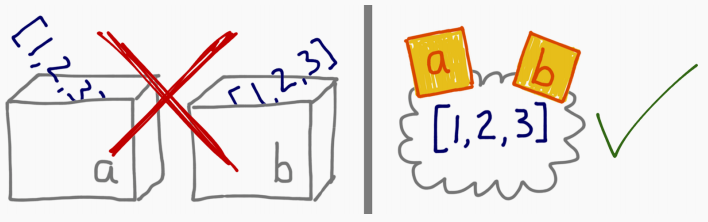

In [1]:
a = [1, 2, 3] # 创建一个列表绑定到变量a
b = a         # 将变量b绑定到a所引用的相同值。
a.append(4)   # 修改由a引用的列表
b # b的值也发生了修改

[1, 2, 3, 4]

因此，`b=a`语句没有拷贝盒子`a`中的内容到盒子`b`，而是将标签`b`附加到已经标注了`a`的盒子上。

还有，赋值语句的右边先执行。下面通过代码展示一下：

In [3]:
class Gizmo:
    def __init__(self):
        print(f'Gizmo id: {id(self)}')
        
x = Gizmo() # 输出的 Gizmo id: ... 是创建 Gizmo 实例的副作用

Gizmo id: 3027904651424


In [4]:
y = Gizmo() * 10 # 在乘法运算中使用 Gizmo 实例会抛出异常，在尝试求积之前其实会创建一个新的 Gizmo 实例

Gizmo id: 3027904646016


TypeError: unsupported operand type(s) for *: 'Gizmo' and 'int'

In [6]:
dir() # 但不会创建变量y,因为在赋值语句的右边进行求值时抛出了异常

['Gizmo',
 'In',
 'Out',
 '_',
 '_1',
 '_5',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i2',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'a',
 'b',
 'exit',
 'get_ipython',
 'quit',
 'x']

> 为了理解 Python 中的赋值语句，应该始终先读右边。对象在右边创建或获取，在此之后左边的变量才会绑定到对象上，这就像为对象贴上标签。

因为变量只不过是标签，所以无法阻止为对象贴上多个标签。贴的多个标签，就是别名。

# 标识、相等性和别名

Lewis Carroll 是 Charles Lutwidge Dodgson 教授的笔名。Carroll 先生指的就是 Dodgson 教授，二者是同一个人。示例用 Python 表达了这个概念。

In [7]:
charles = {'name': 'Charles L. Dodgson', 'born': 1832}
lewis = charles # lewis是charles的别名
lewis is charles 

True

In [8]:
id(charles), id(lewis) # id函数得到的结果都是一样的

(3027900318080, 3027900318080)

In [9]:
lewis['balance'] = 950 # 向 lewis中添加一个元素相当于向charles中添加一个元素
charles

{'name': 'Charles L. Dodgson', 'born': 1832, 'balance': 950}

然而，假如有冒充者（姑且叫他 Alexander Pedachenko 博士）生于1832年，声称他是 Charles L. Dodgson。这个冒充者的证件可能一样，但是 Pedachenko 博士不是Dodgson教授。这种情况如下图所示。

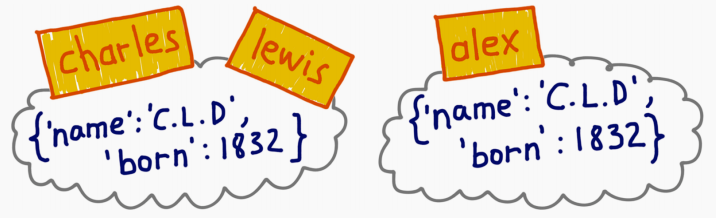


In [12]:
alex = {'name': 'Charles L. Dodgson', 'born': 1832, 'balance': 950} # alex 指代的对象与赋值给 charles 的对象内容一样
alex == charles # 比较两个对象，结果相等，这是因为 dict 类的 __eq__ 方法就是这 样实现的。

True

In [11]:
alex is not charles # 但它们是不同的对象，这是Python说明标识不同的方式。

True

示例体现了别名。在那段代码中，lewis 和 charles 是别名，即两个变量绑定同一个对象。而 alex 不是 charles 的别名，因为二者绑定的是不同的对象。alex 和 charles 绑定的对象具有相同的值（== 比 较的就是值），但是它们的标识不同。

> 每个变量都有标识、类型和值。对象一旦创建，它的标识绝不会变；你可以把标识理解为对象在内存中的地址。is 运算符比较两个对象的标识；id()函数返回对象标识的整数表示。

其实，编程中很少使用id()函数。标识最常使用is运算符检查，而不是直接比较ID。接下来讨论is和==的异同。

## 在==和is之间选择

`==`操作比较对象的值(对象保存的数据)，而`is`比较的是它们的标识。

通常，我们关注的是值，而不是标识，因此 Python 代码中 == 出现的频 率比 is 高。 

然而，在变量和单例值之间比较时，应该使用`is`。目前，最常使用`is`检查变量绑定的值是不是 `None`。
下面是推荐的写法：

```py
x is None
```
否定的正确写法是：
```py
x is not None
```

`None`是我们最常用`is`进行测试的。哨兵对象是我们用`is`测试的单例的另一个例子。下面是一种创建并测试一个哨兵对象的方式：
```py
END_OF_DATA = object()
# ... many lines
def traverse(...):
    # ... more lines
    if node is END_OF_DATA:
        return
    # etc.
```


`is`运算符比`==` 速度快，因为它不能重载，所以 Python 不用寻找并调用特殊方法，而是直接比较两个整数 ID。而 `a == b` 是语法糖，等同于 `a.__eq__(b)`。继承自 object 的 `__eq__ `方法比较两个对象的 ID，结果与 `is` 一样。但是多数内置类型使用更有意义的方式覆盖了 `__eq__` 方法，会考虑对象属性的值。相等性测试可能涉及大量处理工作，例如，比较大型集合或嵌套层级深的结构时。

## 元组的相对不可变性

元组与多数 Python 集合（列表、字典、集，等等）一样，保存的是对象的引用。如果引用的对象是可变的，即便元组本身不可变，元素依然可变。也就是说，元组的不可变性其实是指tuple数据结构的物理内容（即保存的引用）不可变，与引用的对象无关。


> 而 str、bytes 和 array.array 等单一类型序列是扁平的，它们保存的不是引用，而是在连 续的内存中保存数据本身（字符、字节和数字）。

下面的代码表明，元组的值会随着引用的可变对象的变化而变。元组中不可变的是元素的标识。

In [13]:
t1 = (1, 2, [30, 40]) # t1 不可变，但是 t1[-1] 可变。
t2 = (1, 2, [30, 40]) # 构建元组 t2，它的元素与 t1 一样。
t1 == t2 # 虽然 t1 和 t2 是不同的对象，但是二者相等——与预期相符。

True

In [14]:
id(t1[-1]) # 查看 t1[-1] 列表的标识。

3027901157056

In [16]:
t1[-1].append(99) #  就地修改 t1[-1] 列表。
t1

(1, 2, [30, 40, 99, 99])

In [17]:
id(t1[-1]) # t1[-1] 的标识没变，只是值变了

3027901157056

In [18]:
t1 == t2 # 现在，t1 和 t2 不相等。

False

复制对象时，相等性和标识之间的区别有更深入的影响。副本与源对象 相等，但是ID不同。可是，如果对象中包含其他对象，那么应该复制内部对象吗？可以共享内部对象吗？这些问题没有唯一的答案。参见下述讨论。

# 默认做浅复制

复制列表（或多数内置的可变集合）最简单的方式是使用内置的类型构造方法。例如：

In [19]:
l1 = [3, [55, 44], (7, 8, 9)]
l2 = list(l1) # list(l1) 创建 l1 的副本
l2

[3, [55, 44], (7, 8, 9)]

In [21]:
l2 == l1 # 副本与源列表相等。

True

In [22]:
l2 is l1 # 但是二者指代不同的对象。

False

对列表和其他可变序列来说，还能使用简洁的`l2 = l1[:]`语句创建副本。

然而，构造方法或`[:]`做的是浅复制（即复制了最外层容器，副本中的元素是源容器中元素的引用）。如果所有元素都是不可变的，那么这样没有问题，还能节省内存。但是，如果有可变的元素，可能就会导致意想不到的问题。

下面，我们为一个包含另一个列表和一个元组的列表做了浅复制，然后做了些修改，看看对引用的对象有什么影响。


In [23]:
l1 = [3, [66, 55, 44], (7, 8, 9)]
l2 = list(l1)  # l2是l1的浅复制
l1.append(100) # 把100追加到l1中，对l2没影响
l1[1].remove(55)  # 把内部列表l1[1]中的55删除。这对l2有影响，因为l2[1]绑定的列表与l1[1]是同一个。
print('l1:', l1)
print('l2:', l2)
l2[1] += [33, 22]  # 对可变的对象来说，如l2[1]引用的列表，+= 运算符就地修改列表。这次修改在 l1[1]中也有体现，因为它是l2[1]的别名。
l2[2] += (10, 11) # 对元组来说，+= 运算符创建一个新元组，然后重新绑定给变量l2[2]。这等同于 l2[2] = l2[2] + (10, 11)。现在，l1和l2中最后位置上的元组不是同一个对象。
print('l1:', l1)
print('l2:', l2)

l1: [3, [66, 44], (7, 8, 9), 100]
l2: [3, [66, 44], (7, 8, 9)]
l1: [3, [66, 44, 33, 22], (7, 8, 9), 100]
l2: [3, [66, 44, 33, 22], (7, 8, 9, 10, 11)]


强烈建议你在 Python Tutor 网站http://www.pythontutor.com 中查看上面代码的交互。下面是一个录屏：

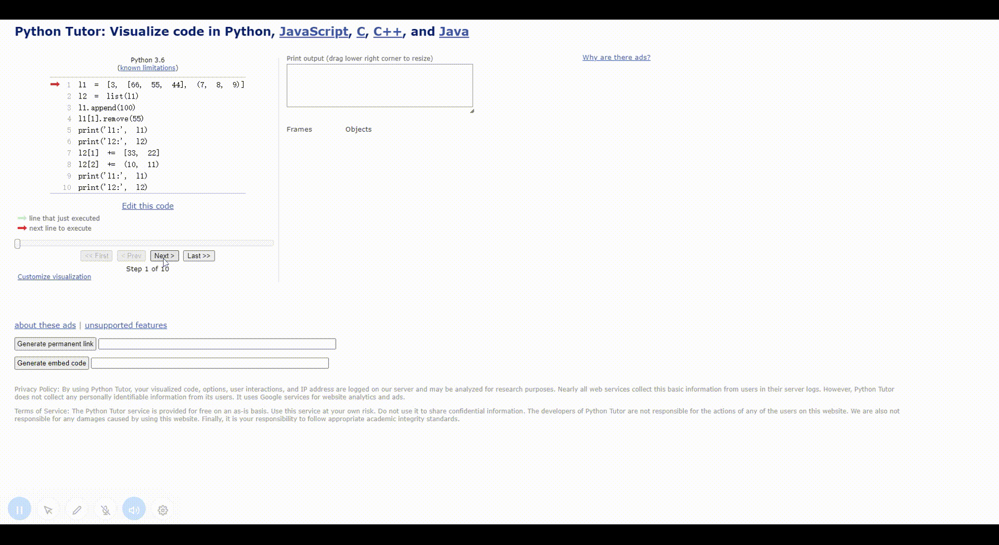

现在你应该明白了，浅复制容易操作，但是得到的结果可能并不是你想要的。接下来说明如何做深复制。

## 为任意对象做深复制和浅复制

浅复制没什么问题，但有时我们需要的是深复制（即副本不共享内部对象的引用）。`copy`模块提供的`deepcopy`和 `copy`函数能为任意对象做深复制和浅复制。 

为了演示 `copy()` 和 `deepcopy()` 的用法，下面定义了一个简单的 类，`Bus`。这个类表示运载乘客的校车，在途中乘客会上车或下车。

In [24]:
class Bus:
    def __init__(self, passengers=None):
        if passengers is None:
            self.passengers = []
        else:
            self.passengers = list(passengers)
            
    def pick(self, name):
        self.passengers.append(name)
        
    def drop(self, name):
        self.passengers.remove(name)

下面我们将创建一个 `Bus` 实例`bus1`和两个副本，一个是浅复制副本`bus2`，另一个是深复制副本`bus3`，看看在 `bus1` 有学生下车后会发生什么。

In [26]:
import copy
bus1 = Bus(['Alice', 'Bill', 'Claire', 'David'])
bus2 = copy.copy(bus1)
bus3 = copy.deepcopy(bus1)
id(bus1), id(bus2), id(bus3) # 使用 copy 和 deepcopy，创建 3 个不同的 Bus 实例。

(3027913431120, 3027913430784, 3027914263856)

In [27]:
bus1.drop('Bill')
bus2.passengers # bus1 中的 'Bill' 下车后，bus2 中也没有他了

['Alice', 'Claire', 'David']

In [29]:
id(bus1.passengers), id(bus2.passengers), id(bus3.passengers) # 审查passengers属性后发现，bus1和bus2共享同一个列表对象，因为 bus2是bus1的浅复制副本。

(3027936832704, 3027936832704, 3027936771200)

In [31]:
bus3.passengers # bus3是bus1的深复制副本，因此它的 passengers 属性指代另一个列表。

['Alice', 'Bill', 'Claire', 'David']

注意，一般来说，深复制不是件简单的事。如果对象有循环引用，那么这个朴素的算法会进入无限循环。`deepcopy` 函数会记住已经复制的对象，因此能优雅地处理循环引用，如示例所示。

In [32]:
a = [10, 20]
b = [a, 30]
a.append(b)
a

[10, 20, [[...], 30]]

In [33]:
from copy import deepcopy
c = deepcopy(a)
c

[10, 20, [[...], 30]]

此外，深复制有时可能太深了。例如，对象可能会引用不该复制的外部资源或单例值。我们可以实现特殊方法 `__copy__()` 和 `__deepcopy__()`，控制 copy 和 deepcopy的行为。

# 函数的参数作为引用时

Python 唯一支持的参数传递模式是共享传参(call by sharing，或称为按引用传参)。多数面向对象语言都采用这一模式，包括 Ruby、Smalltalk 和 Java（Java 的引用类型是这样，基本类型按值传参）。

共享传参指函数的各个形式参数获得实参中各个引用的副本。也就是说，函数内部的形参是实参的别名。

这种方案的结果是，函数可能会修改作为参数传入的可变对象，但是无法修改那些对象的标识（即不能把一个对象替换成另一个对象）。示例中有个简单的函数，它在参数上调用 `+=` 运算符。分别把数字、列表和元组传给那个函数，实际传入的实参会以不同的方式受到影响。


In [34]:
def f(a, b):
    a += b
    return a

In [35]:
x = 1
y = 2
f(x, y)

3

In [38]:
x, y # 数字 x 没变

(1, 2)

In [37]:
a = [1, 2]
b = [3, 4]
f(a, b)

[1, 2, 3, 4]

In [39]:
a, b # 列表 a 变了

([1, 2, 3, 4], [3, 4])

In [41]:
t = (10, 20)
u = (30, 40)
f(t, u) # 元组t未改变

(10, 20, 30, 40)

In [42]:
t, u

((10, 20), (30, 40))

与函数参数相关的另一个问题是使用可变值作为默认值，下一节会讨论。

## 不要使用可变类型作为参数的默认值

可选参数可以有默认值，这是Python函数定义的一个很棒的特性，这样我们的API在进化的同时能保证向后兼容。然而，我们应该避免使用可变的对象作为参数的默认值。

下面在示例中说明这个问题。我们以上面示例中的 `Bus` 类为基础 定义一个新类， `HauntedBus`，然后修改 `__init__` 方法。这一次，`passengers` 的默认值不是 `None`，而是 `[]`，这样就不用像之前那样使用 `if` 判断了。这个“聪明的举动”会让我们陷入麻烦。


In [50]:
class HauntedBus:
    """A bus model haunted by ghost passengers"""
    def __init__(self, passengers=[]):  #  如果没传入 passengers 参数，使用默认绑定的列表对象，一开始是空列表。
        self.passengers = passengers  #  这个赋值语句把 self.passengers变成passengers的别名，而没有传入passengers参数时，passengers又是默认列表的别名。
        
    def pick(self, name):
        self.passengers.append(name)  # 在 self.passengers 上调用 .remove() 和 .append() 方法时，修改的其实是默认列表，它是函数对象的一个属性。
        
    def drop(self, name):
        self.passengers.remove(name)

In [51]:
bus1 = HauntedBus(['Alice', 'Bill']) # bus1首先有两个乘客
bus1.passengers

['Alice', 'Bill']

In [52]:
bus1.pick('Charlie')
bus1.drop('Alice') 
bus1.passengers # 到目前为止没啥问题

['Bill', 'Charlie']

In [53]:
bus2 = HauntedBus() # 一开始，bus2是空的，因此把默认的空列表赋值给 self.passengers
bus2.pick('Carrie')
bus2.passengers

['Carrie']

In [54]:
bus3 = HauntedBus() # bus3 一开始也是空的，因此还是赋值默认的列表。
bus3.passengers # 但是默认列表不为空

['Carrie']

In [55]:
bus3.pick('Dave') 
bus2.passengers # 登上 bus3 的 Dave 出现在 bus2 中。

['Carrie', 'Dave']

In [56]:
bus2.passengers is bus3.passengers # 问题是，bus2.passengers 和 bus3.passengers 指代同一个列表。

True

In [57]:
bus1.passengers # 但 bus1.passengers 是不同的列表。

['Bill', 'Charlie']

问题在于，没有指定初始乘客的 `HauntedBus` 实例会共享同一个乘客列表。这种问题很难发现。如示例所示，实例化 `HauntedBus` 时，如果传入`passengers`参数，会按预期运作。但是不为 `HauntedBu`s 指定`passengers`的话，奇怪的事就发生了，这是因为 `self.passengers` 变成了 `passengers` 参数默认值的别名。出现这个问题的根源是，默认值在定义函数时计算（通常在加载模块时），因此默认值变成了函数对象的属性。因此，如果默认值是可变对象，而且修改了它的值，那么后续的函数调用都会受到影响。

运行示例中的代码之后，可以审查 `HauntedBus.__init__` 对 象，看看它的 `__defaults__` 属性中的那些幽灵学生：

In [58]:
dir(HauntedBus.__init__)

['__annotations__',
 '__call__',
 '__class__',
 '__closure__',
 '__code__',
 '__defaults__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__globals__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__kwdefaults__',
 '__le__',
 '__lt__',
 '__module__',
 '__name__',
 '__ne__',
 '__new__',
 '__qualname__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

In [59]:
HauntedBus.__init__.__defaults__

(['Carrie', 'Dave'],)

最后，我们可以验证`bus2.passengers` 是一个别名，它绑定到 `HauntedBus.__init__.__defaults__` 属性的第一个元素上：

In [60]:
HauntedBus.__init__.__defaults__[0] is bus2.passengers

True

可变默认值导致的这个问题说明了为什么通常使用 `None` 作为接收可变值的参数的默认值。在最开始的代码中，`__init__` 方法检查 `passengers` 参数的值是不是 `None`，如果是就把一个新的空列表赋值给 `self.passengers`。下一节会说明，如果 `passengers` 不是 `None`，正确的实现会把 `passengers` 的副本赋值给 `self.passengers`。下面详解。

## 防御可变参数

如果定义的函数接收可变参数，应该谨慎考虑调用方是否期望修改传入的参数。

例如，如果函数接收一个字典，而且在处理的过程中要修改它，那么这个副作用要不要体现到函数外部？具体情况具体分析。这其实需要函数的编写者和调用方达成共识。


在本章最后一个`bus`示例中，`TwilightBus` 实例与客户共享乘客列表，这会产生意料之外的结果。在分析实现之前，我们先从客户的角度 看看 `TwilightBus` 类是如何工作的。




In [62]:
basketball_team = ['Sue', 'Tina', 'Maya', 'Diana', 'Pat'] # basketball_team 中有 5 个学生的名字。
bus = TwilightBus(basketball_team) # 使用这队学生实例化 TwilightBus。
bus.drop('Tina') #  一个学生从 bus 下车了，接着又有一个学生下车了
bus.drop('Pat')
basketball_team # 下车的学生从篮球队中消失了！

['Sue', 'Maya', 'Diana']

`TwilightBus`违反了设计接口的最佳实践，即“最少惊讶原则”。学生从校车中下车后，她的名字就从篮球队的名单中消失了，这确实让人惊讶。

下面是`TwilightBus`的实现，随后解释了出现这个问题的原因。

In [64]:
class TwilightBus:
    """A bus model that makes passengers vanish"""
    def __init__(self, passengers=None):
        if passengers is None:
            self.passengers = []  # 当 passengers 为 None 时，创建一个新的空列表。
        else:
            self.passengers = passengers  # 然而，这个赋值语句把 self.passengers变成passengers的别 名，而后者是传给 __init__ 方法的实参（即上面的 basketball_team）的别名。
            
    def pick(self, name):
        self.passengers.append(name)
        
    def drop(self, name):
        self.passengers.remove(name) # 在 self.passengers 上调用 .remove() 和 .append() 方法其实会修改传给构造方法的那个列表。

这里的问题是，`bus`为传给构造方法的列表创建了别名。正确的做法是，`bus`自己维护`passengers`。修正的方法很简单：在 `__init__` 中，传 入 `passengers` 参数时，应该把参数值的副本赋值给 `self.passengers`：

In [65]:
class TwilightBus:
    
    def __init__(self, passengers=None):
        if passengers is None:
            self.passengers = []  
        else:
            self.passengers = list(passengers)  
            
    def pick(self, name):
        self.passengers.append(name)
        
    def drop(self, name):
        self.passengers.remove(name) # 

在内部像这样处理乘客列表，就不会影响初始化校车时传入的参数了。 此外，这种处理方式还更灵活：现在，传给 `passengers` 参数的值可以是元组或任何其他可迭代对象，例如 `set` 对象，甚至数据库查询结果， 因为 `list` 构造方法接受任何可迭代对象。自己创建并管理列表可以确保支持所需的 `.remove()` 和 `.append()` 操作，这样 `.pick()` 和`.drop()` 方法才能正常运作。

# del和垃圾回收

> 对象绝不会自行销毁；然而，无法得到对象时，可能会被当作垃圾回收。

关于`del`的第一个奇怪的事实是它不是一个函数，而是一个语句。我们写`del x`而不是`del(x)`——尽管后者也能工作，但仅因为表达式`x`和`(x)`在Python中是一样的。

第二个奇怪的是`del`删除的是引用，而不是对象。`del` 命令可能会导致对象被当作垃圾回收，但是仅当删除的变量保存的是对象的最后一个引用，或者无法得到对象时。 重新绑定也可能会导致对象的引用数量归零，导致对象被销毁。


In [66]:
a = [1, 2] # 创建对象[1,2]然后绑定到a
b = a      # 绑定b到同样的[1,2]对象
del a      # 删除引用a
b          # [1,2]没被影响，因为b仍然指向它

[1, 2]

In [67]:
b = [3] # 重新绑定b到不同的对象移除了最后到[1,2]的引用。现在垃圾回收器可以回收对象[1,2]

> 有个 `__del__` 特殊方法，但是它不会销毁实例，不应该在代码中调用。即将销毁实例时，Python 解释器会调用 `__del__` 方 法，给实例最后的机会，释放外部资源。自己编写的代码很少需要实现 `__del__` 代码，有些 Python 新手会花时间实现，但却吃力不讨好，因为 `__del__` 很难用对。

在 `CPython` 中，垃圾回收使用的主要算法是引用计数。实际上，每个对象都会统计有多少引用指向自己。当引用计数归零时，对象立即就被销毁：CPython 会在对象上调用 `__del__` 方法（如果定义了），然后释放分配给对象的内存。CPython 2.0 增加了分代垃圾回收算法，用于检测引用循环中涉及的对象组——如果一组对象之间全是相互引用，即使再出色的引用方式也会导致组中的对象不可获取。Python 的其他实现有更 杂的垃圾回收程序，而且不依赖引用计数，这意味着，对象的引用数量为零时可能不会立即调用 `__del__`方法。A. Jesse Jiryu Davis 写 的“PyPy, Garbage Collection, and a Deadlock”一文 （https://emptysqua.re/blog/pypy-garbage-collection-and-a-deadlock/）对`__del__` 方法的恰当用法和不当用法做了讨论。

为了演示对象生命结束时的情形，下面使用 `weakref.finalize` 注册一个回调函数，在销毁对象时调用。

In [73]:
import weakref

s1 = {1, 2, 3} 
s2 = s1  # s1 和 s2 是别名，指向同一个集合，{1, 2, 3}。

def bye(): # 这个函数一定不能是要销毁的对象的绑定方法，否则会有一个指向对象的引用。
    print('...like tears in the rain.')
    
ender = weakref.finalize(s1, bye)  # 在 s1 引用的对象上注册 bye 回调
ender.alive #  调用 finalize 对象之前，.alive 属性的值为 True

True

In [74]:
del s1
ender.alive # 如前所述，del 不删除对象，而是删除对象的引用

True

In [75]:
s2 = 'spam' # 重新绑定最后一个引用 s2，让 {1, 2, 3} 无法获取。对象被销毁了，调用了bye回调，ender.alive 的值变成了 False。

...like tears in the rain.


In [76]:
ender.alive

False

上面示例的目的是明确指出 `del` 不会删除对象，但是执行 `del` 操作后 可能会导致对象不可获取，从而被删除。

你可能觉得奇怪，为什么示例中的 `{1, 2, 3}` 对象被销毁了？毕竟，我们把 `s1` 引用传给 `finalize` 函数了，而为了监控对象和调用回调，必须要持有引用。这是因为，`finalize` 持有 `{1, 2, 3}` 的弱引用。

# 弱引用

正是因为有引用，对象才会在内存中存在。当对象的引用计数归零后，垃圾回收程序会把对象销毁。但是，有时需要引用对象，而不让对象存在的时间超过所需的时间。这经常用在缓存中。

弱引用不会增加对象的引用数量。引用的目标对象称为所指对象(referent)。因此我们说，若引用不会妨碍所指对象被当做垃圾回收。

弱引用在缓存应用中很有用，因为我们不想仅因为被缓存引用着而始终保存缓存对象。

下面的代码展示了如何还是用`weakref.ref`实例获取所指对象。如果对象存在，调用弱引用可以获取对象；否则返回`None`。



In [77]:
import weakref
a_set = {0, 1}
wref = weakref.ref(a_set) # 创建弱引用对象 wref，下一行审查它
wref

<weakref at 0x000002C0FF1CA810; to 'set' at 0x000002C0FDD1C900>

In [78]:
wref() # 调用 wref() 返回的是被引用的对象，{0, 1}。因为这是控制台会话，所以 {0, 1} 会绑定给 _ 变量。

{0, 1}

In [79]:
a_set = {2, 3, 4} # a_set 不再指代 {0, 1} 集合，因此集合的引用数量减少了。但是 _ 变量仍然指代它。

In [80]:
wref() # 调用 wref() 依旧返回 {0, 1}

{0, 1}

In [81]:
wref() is None # 计算这个表达式时，{0, 1} 存在，因此 wref() 不是 None。但是， 随后 _ 绑定到结果值 False。现在 {0, 1} 没有强引用了。

False

In [82]:
wref() is None # 因为 {0, 1} 对象不存在了，所以 wref() 返回 None。

False

> 上面是一个控制台会话，Python 控制台会自动把 _ 变量绑定到结果不为 None 的表达式结果上。

weakref 模块的文档（http://docs.python.org/3/library/weakref.html）指 出，`eakref.ref`类其实是低层接口，供高级用途使用，多数程序最好使用 `wakref`集合和 `inalize`也就是说，应该使用 `eakKeyDictionary`、`WeakValueDictionary`、`WeakSet` 和 `finalize`（在内部使用弱引用），不要自己动手创建并处理 `weakref.ref` 实例。我们在示例中那么做是希望借助实际使用 `weakref.ref` 来褪去它的神秘色彩。但是实际上，多数时候 Python 程序都使用 `weakref` 集合。 下一节简要讨论 `weakref` 集合。

## WeakValueDictionary简介

`WeakValueDictionary` 类实现的是一种可变映射，里面的值是对象的弱引用。被引用的对象在程序中的其他地方被当作垃圾回收后，对应的键会自动从 `WeakValueDictionary` 中删除。因此，`WeakValueDictionary` 经常用于缓存。

我们对 `WeakValueDictionary` 的演示受到来自英国六人喜剧团体 Monty Python 的经典短剧《奶酪店》的启发，在那出短剧里，客户问了 40 多种奶酪，包括切达干酪和马苏里拉奶酪，但是都没有货。



In [83]:
class Cheese: 
    def __init__(self, kind): 
        self.kind = kind 
        
    def __repr__(self): 
        return 'Cheese(%r)' % self.kind

下面，我们把 `catalog` 中的各种奶酪载入 `WeakValueDictionary` 实现的 `stock` 中。然而，删除 `catalog` 后，`stock` 中只剩下一种奶酪了。你知道为什么帕尔马干酪 （Parmesan）比其他奶酪保存的时间长吗？ 代码后面的提示中有答案。

In [85]:
import weakref

stock = weakref.WeakValueDictionary() # stock 是 WeakValueDictionary 实例。

catalog = [Cheese('Red Leicester'), Cheese('Tilsit'), Cheese('Brie'), Cheese('Parmesan')]

for cheese in catalog:
    stock[cheese.kind] = cheese # stock 把奶酪的名称映射到 catalog 中 Cheese 实例的弱引用上

sorted(stock.keys()) #  stock 是完整的

['Brie', 'Parmesan', 'Red Leicester', 'Tilsit']

In [86]:
del catalog
sorted(stock.keys()) # 删除 catalog 之后，stock 中的大多数奶酪都不见了，这是 WeakValueDictionary 的预期行为。为什么不是全部呢？

['Parmesan']

In [87]:
del cheese
sorted(stock.keys())

[]

这是因为循环中的`cheese`临时变量引用了对象，这可能会导致该变量的存在时间比预期长。通常，这对局部变量来说不是问题，因为它们在函数返回时会被销毁。但在上面`for` 循环中的变量 `cheese` 是全局变量，除非显式删除，否则不会消失。

与 `WeakValueDictionary` 对应的是 `WeakKeyDictionary`，后者的键是弱引用。

`weakref` 模块还提供了 `WeakSet` 类，按照文档的说明，这个类的作用很简单："保存元素弱引用的集合类。元素没有强引用时，集合会把它删除。" 如果一个类需要知道所有实例，一种好的方案是创建一个 `WeakSet` 类型的类属性，保存实例的引用。如果使用常规的 `set`，实例永远不会被垃圾回收，因为类中有实例的强引用，而类存在的时间与 Python 进程一样长，除非显式删除类。

这些集合，以及一般的弱引用，能处理的对象类型有限。参见下一节的说明。

## 弱引用的局限

不是每个 Python 对象都可以作为弱引用的目标（或称所指对象）。基本的`list` 和 `dict` 实例不能作为所指对象，但是它们的子类可以轻松地解决这个问题：

In [88]:
class MyList(list): 
    """list的子类，实例可以作为弱引用的目标""" 
    
a_list = MyList(range(10)) # a_list可以作为弱引用的目标

wref_to_a_list = weakref.ref(a_list)

`set` 实例可以作为所指对象，因此上面的演示才使用 `set` 实例。用户定义的类型也没问题，这就解释了示例中为什么使用那个简单的 `Cheese` 类。但是，`int` 和 `tuple` 实例不能作为弱引用的目标，甚至它们的子类也不行。

这些局限基本上是 CPython 的实现细节，在其他 Python 解释器中情况可能不一样。这些局限是内部优化导致的结果，下一节会以其中几个类型为例讨论。

# Python对不可变类型施加的把戏

我惊讶地发现，对元组`t`来说，`t[:]` 不创建副本，而是返回同一个对象的引用。此外，`tuple(t)` 获得的也是同一个元组的引用。 示例证明了这一点。

In [89]:
t1 = (1, 2, 3)
t2 = tuple(t1)
t2 is t1  # t1 和 t2 绑定到同一个对象。

True

In [90]:
t3 = t1[:]
t3 is t1 # t3也是

True

`str`、`bytes` 和 `frozenset` 实例也有这种行为。注意，`frozenset` 实例不是序列，因此不能使用 `fs[:]`（`fs` 是一个 `frozenset` 实例）。但是，`fs.copy()` 具有相同的效果：它会欺骗你，返回同一个对象的引用，而不是创建一个副本，如下面示例所示。

In [92]:
t1 = (1, 2, 3)
t3 = (1, 2, 3) # 新建一个元组
t3 is t1 # t1 和 t3 相等，但不是同一个对象。

False

In [93]:
s1 = 'ABC'
s2 = 'ABC' # 再新建一个字符串。
s2 is s1 # 奇怪的事发生了，a 和 b 指代同一个字符串。

True

共享字符串字面量是一种优化措施，称为驻留（interning）。CPython 还会在小的整数上使用这个优化措施，防止重复创建“热门”数字，如 `0`、`-1` 和 `42`。注意，CPython 不会驻留所有字符串和整数，驻留的条件是实现细节，而且没有文档说明。

> 千万不要依赖字符串或整数的驻留！比较字符串或整数是否相等时，应该使用 ==，而不是 is。驻留是 Python 解释器内部使用的一个特性。

本节讨论的把戏，包括 `frozenset.copy()` 的行为，是“善意的谎言”， 能节省内存，提升解释器的速度。别担心，它们不会为你带来任何麻烦，因为只有不可变类型会受到影响。或许这些细枝末节的最佳用途是与其他 Python 程序员打赌，提高自己的胜算。